In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt


df = pd.read_excel('mention theeras clean2.xlsx')
df

,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,created_at,id_str,quote_count,reply_count,retweet_count,favorite_count,lang,user_id_str,conversation_id_str,username,tweet_url,mention
0,0,0,0,13,Mon Oct 30 18:45:36 +0000 2023,1719063016862520064,0,1,3,65,en,101118493,1719016671044610048,DJFate1200,https://twitter.com/DJFate1200/status/17190630...,JohnBraunwarth
1,1,1,0,13,Mon Oct 30 18:45:36 +0000 2023,1719063016862520064,0,1,3,65,en,101118493,1719016671044610048,DJFate1200,https://twitter.com/DJFate1200/status/17190630...,xxwntrxx
2,2,2,0,13,Mon Oct 30 18:45:36 +0000 2023,1719063016862520064,0,1,3,65,en,101118493,1719016671044610048,DJFate1200,https://twitter.com/DJFate1200/status/17190630...,PopBase
3,3,3,1,14,Mon Oct 30 18:28:20 +0000 2023,1719058671940890112,0,0,2,81,en,1450888676670680064,1719011402642240000,Nami_501,https://twitter.com/Nami_501/status/1719058671...,mtilmann
4,4,4,1,14,Mon Oct 30 18:28:20 +0000 2023,1719058671940890112,0,0,2,81,en,1450888676670680064,1719011402642240000,Nami_501,https://twitter.com/Nami_501/status/1719058671...,hushmirrorball
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2384,2384,2384,1953,8680,Wed Nov 15 11:03:02 +0000 2023,1724744813352790016,0,1,0,0,qam,276510455,1724586055607699968,ladymariastark,https://twitter.com/ladymariastark/status/1724...,brekkersansa
2385,2385,2385,1954,8682,Wed Nov 15 11:02:39 +0000 2023,1724744718989339904,0,0,0,0,pt,421180081,1724741999524270080,tayIIorswifft13,https://twitter.com/tayIIorswifft13/status/172...,callmemarti
2386,2386,2386,1955,8687,Wed Nov 15 11:02:03 +0000 2023,1724744565897210112,0,1,0,0,pt,1378171277429639936,1724741939390550016,_Mary_Dale_,https://twitter.com/_Mary_Dale_/status/1724744...,scaglibeee
2387,2387,2387,1956,9134,Wed Nov 15 09:04:16 +0000 2023,1724714923559990016,0,0,0,0,es,786995141680692992,1724369358518960128,whyshedisappred,https://twitter.com/whyshedisappred/status/172...,scarletwest_


In [ ]:
"""
G = nx.from_pandas_edgelist(df, source="username", target="mention")

fig = plt.subplots(figsize=(100,100))
#plt.margins(.2,.2)
nx.draw(G,
        #pos=nx.circular_layout(G),
        with_labels=True,
        node_color='lightblue',
        node_size=300)
plt.show()
"""

'\nG = nx.from_pandas_edgelist(df, source="username", target="mention")\n\nfig = plt.subplots(figsize=(100,100))\n#plt.margins(.2,.2)\nnx.draw(G,\n        #pos=nx.circular_layout(G),\n        with_labels=True,\n        node_color=\'lightblue\',\n        node_size=300)\nplt.show()\n'

In [ ]:
"""G = nx.from_pandas_edgelist(df, source="username", target="mention")

fig = plt.subplots(figsize=(50,50))
#plt.margins(.2,.2)
nx.draw(G,
        pos=nx.kamada_kawai_layout(G),
        with_labels=True,
        node_color='red',
        node_size=3000,
        edge_color='black')
#plt.title("Grafik Follower Taylor Swift")
plt.show()"""

'G = nx.from_pandas_edgelist(df, source="username", target="mention")\n\nfig = plt.subplots(figsize=(50,50))\n#plt.margins(.2,.2)\nnx.draw(G,\n        pos=nx.kamada_kawai_layout(G),\n        with_labels=True,\n        node_color=\'red\',\n        node_size=3000,\n        edge_color=\'black\')\n#plt.title("Grafik Follower Taylor Swift")\nplt.show()'

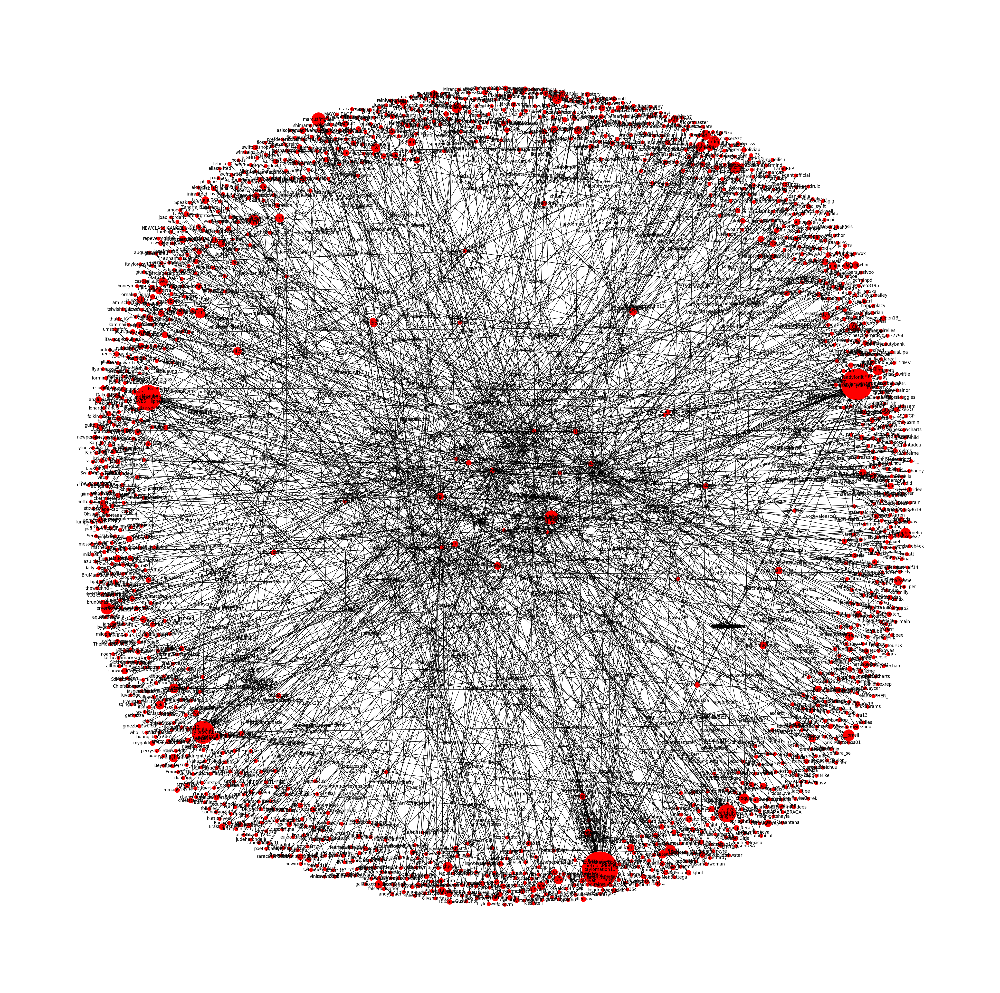

In [ ]:
G = nx.from_pandas_edgelist(df, source="username", target="mention", create_using=nx.DiGraph())

# Menghitung jumlah kemunculan pasangan 'username' dan 'mention'
edge_weights = df.groupby(['username', 'mention']).size().reset_index(name='weight')

# Menambahkan atribut berat ke grafik
for i, row in edge_weights.iterrows():
    u = row['username']
    v = row['mention']
    if G.has_edge(u, v):
        G[u][v].setdefault('weight', 0)
        G[u][v]['weight'] = row['weight']

# Menetapkan ukuran nodes berdasarkan jumlah hubungan
node_sizes = [G.in_degree(node, weight='weight') * 100 for node in G.nodes]

# Menetapkan ukuran edges berdasarkan berat edges
edge_widths = [G[u][v].get('weight', 0) for u, v in G.edges()]

# Menggambar grafik jaringan
fig = plt.subplots(figsize=(50,50))
pos = nx.spring_layout(G)  # Anda dapat menggunakan layout yang sesuai dengan data Anda
nx.draw(G, pos, with_labels=True, node_size=node_sizes, node_color='red')

# Menampilkan grafik
plt.show()

"""
pada setiap running, hasil penempatan nodes akan berbeda
"""

In [ ]:
# Dapatkan jumlah nodes
num_nodes = G.number_of_nodes()

# Dapatkan jumlah edges
num_edges = G.number_of_edges()

print("Jumlah nodes:", num_nodes)
print("Jumlah edges:", num_edges)

Jumlah nodes: 2299
Jumlah edges: 2019


In [ ]:
DC = nx.degree_centrality(G)
DC

{'DJFate1200': 0.0013054830287206266,
 'JohnBraunwarth': 0.0004351610095735422,
 'xxwntrxx': 0.0004351610095735422,
 'PopBase': 0.0026109660574412533,
 'Nami_501': 0.0013054830287206266,
 'mtilmann': 0.0004351610095735422,
 'hushmirrorball': 0.0004351610095735422,
 'tayyoncebutera': 0.0034812880765883376,
 'folkIegends': 0.0004351610095735422,
 'ChartsDuaLipa': 0.0004351610095735422,
 'DUALIPA': 0.0004351610095735422,
 'mirrorballjao': 0.0008703220191470844,
 'updateswiftbr': 0.015665796344647518,
 'russle_crow': 0.0013054830287206266,
 'mariaressa': 0.0004351610095735422,
 'usernamethirdy': 0.0004351610095735422,
 'kentivanxvi': 0.0004351610095735422,
 'Bree7554756026': 0.0004351610095735422,
 'itstaytaylors': 0.002175805047867711,
 'lavenderpain13': 0.0004351610095735422,
 'vampireswiftt': 0.0004351610095735422,
 'Hnoyemoon': 0.0004351610095735422,
 'CaseyJo826': 0.0004351610095735422,
 'madmandine13': 0.0004351610095735422,
 'SwiftyHitomi': 0.0013054830287206266,
 'taylorswift13': 0

In [ ]:
# Convert the 'DC' dictionary into a Pandas Series
centrality_series = pd.Series(DC)

# Use the 'nlargest' function to get the top 10 greatest centrality values
top_10_centrality = centrality_series.nlargest(10)

# Convert the resulting Series back into a Pandas DataFrame
top_10_df = top_10_centrality.to_frame()
top_10_df

,0
taylornation13,0.035683
taylorswift13,0.026980
updateswiftbr,0.015666
dorikopokego,0.014360
taylorswiftbr,0.013055
vivas_bianca,0.011314
coneyvisland,0.009574
folkloredu,0.009574
FlossySwift,0.009138
killxrfreddie,0.009138
